In [2]:
import os
import random
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from rasterio.features import geometry_mask
from rasterio.windows import Window
from rasterio.warp import calculate_default_transform, reproject, Resampling, transform_geom

In [3]:
src_path= './data/1041.tif'

In [4]:
data = rasterio.open(src_path)

In [5]:
type(data)

rasterio.io.DatasetReader

In [6]:
data.profile

{'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 28000, 'height': 27983, 'count': 4, 'crs': CRS.from_epsg(4326), 'transform': Affine(4.491576420597657e-06, 0.0, 30.039231,
       0.0, -4.491576420597608e-06, -1.8970310000000121), 'blockysize': 32, 'tiled': False, 'compress': 'lzw', 'interleave': 'pixel'}

In [7]:
data.bounds

BoundingBox(left=30.039231, bottom=-2.022718782977595, right=30.164995139776735, top=-1.8970310000000121)

In [8]:
data.lnglat()

(30.102113069888368, -1.9598748914888036)

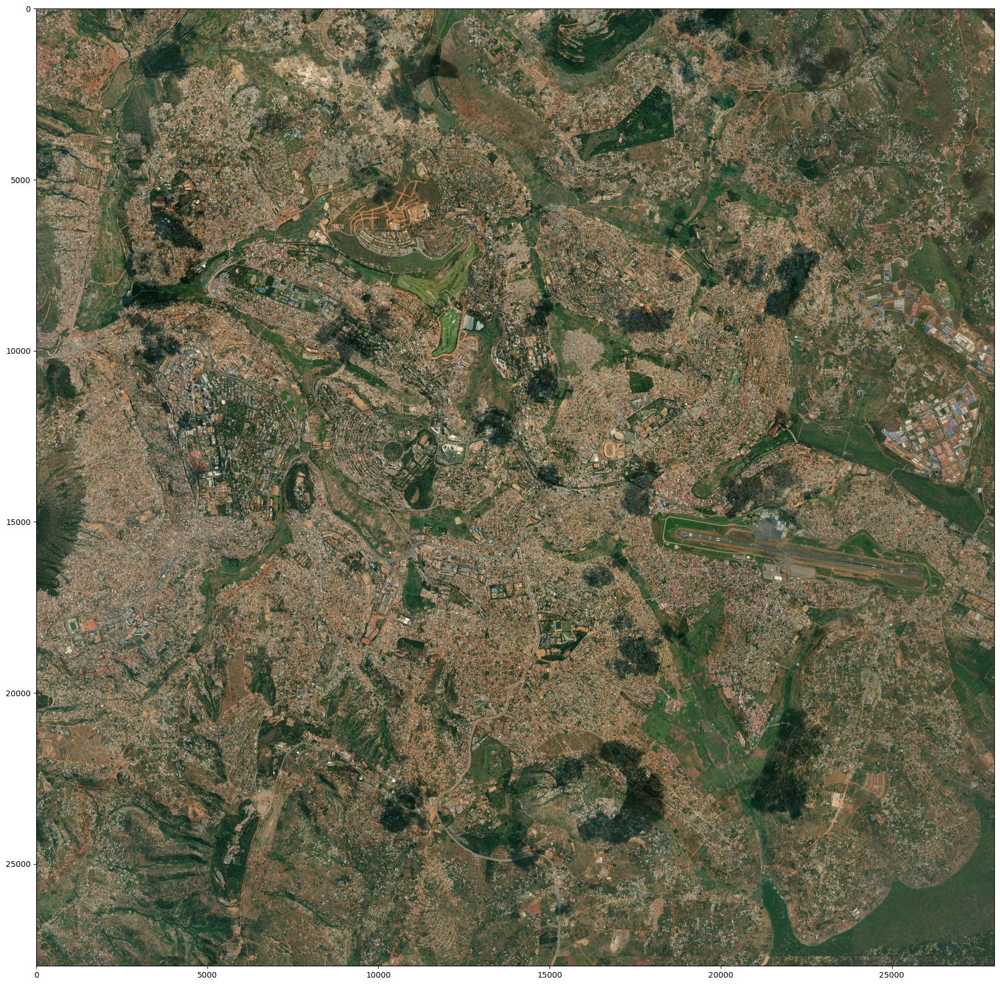

In [9]:
plt.figure(figsize=(22, 22))
plt.imshow(data.read([1,2,3]).transpose(1, 2, 0))

In [21]:
dst_image_dir = './mydata/imagess'

In [22]:
os.makedirs(dst_image_dir, exist_ok=True)

In [23]:
i = 1
city = src_path.split("/")[-3]
code = src_path.split("/")[-2]

In [24]:
def get_tile_name_path(dst_dir:str, index:int, city:str, code:str):
    '''
    Generating index-specific tile name and path
    '''
    dst_tile_name = f"{city}_{code}_{str(index).zfill(5)}.tif"
    dst_tile_path = os.path.join(dst_dir, dst_tile_name)
    return dst_tile_name, dst_tile_path

In [25]:
def get_tile_transform(parent_transform, pixel_x: int, pixel_y: int):
    '''
    Creates a tile transform matrix from the parent TIFF image
    '''
    crs_x = parent_transform.c + pixel_x * parent_transform.a
    crs_y = parent_transform.f + pixel_y * parent_transform.e
    tile_transform = rasterio.Affine(parent_transform.a, parent_transform.b, crs_x,
                                     parent_transform.d, parent_transform.e, crs_y)
    return tile_transform 

In [26]:
def get_tile_profile(parent_tif: rasterio.io.DatasetReader, pixel_x: int, pixel_y: int):
    '''
    Prepares the tile profile
    '''
    tile_crs = parent_tif.crs
    tile_nodata = parent_tif.nodata if parent_tif.nodata is not None else 0
    tile_transform = get_tile_transform(parent_tif.transform, pixel_x, pixel_y)
    profile = dict(
        driver="GTiff",
        crs=tile_crs,
        nodata=tile_nodata,
        transform=tile_transform
    )
    return profile

In [27]:
def generate_tiles(tif: rasterio.io.DatasetReader, size: int, dst_dir: str):
    for y in tqdm(range(0, tif.height, size)):
        for x in range(0, tif.width, size):
            # Creating the tile-specific profile
            profile = get_tile_profile(tif, x, y)

            # Extracting the pixel data
            tile_data = tif.read(window=((y, y + size), (x, x + size)),
                                 boundless=True, fill_value=profile['nodata'])[:3]
            dst_name, dst_tile_path = get_tile_name_path(dst_image_dir, i, city, code)
            c, h, w = tile_data.shape
            profile.update(
                height=h,
                width=w,
                count=c,
                dtype=tile_data.dtype,
                tiled='yes',
                blockxsize=size,
                blockysize=size,
                compress='lzw'
            )
            with rasterio.open(dst_tile_path, "w", **profile) as dst:
                dst.write(tile_data)
            # Rename the tile file to include the ID in the file name
            new_dst_tile_name = f"{city}_{code}_{i}.tif"
            new_dst_tile_path = os.path.join(dst_dir, new_dst_tile_name)
            os.rename(dst_tile_path, new_dst_tile_path)
            i += 1

In [28]:
def generate_tiles(tif: rasterio.io.DatasetReader, size: int, dst_dir: str):
    i = 1  # Initialize 'i' inside the function
    for y in tqdm(range(0, tif.height, size)):
        for x in range(0, tif.width, size):
            # Creating the tile-specific profile
            profile = get_tile_profile(tif, x, y)

            # Extracting the pixel data
            tile_data = tif.read(window=((y, y + size), (x, x + size)),
                                 boundless=True, fill_value=profile['nodata'])[:3]
            dst_name, dst_tile_path = get_tile_name_path(dst_image_dir, i, city, code)
            c, h, w = tile_data.shape
            profile.update(
                height=h,
                width=w,
                count=c,
                dtype=tile_data.dtype,
                tiled='yes',
                blockxsize=size,
                blockysize=size,
                compress='lzw'
            )
            with rasterio.open(dst_tile_path, "w", **profile) as dst:
                dst.write(tile_data)
            # Rename the tile file to include the ID in the file name
            new_dst_tile_name = f"{city}_{code}_{i}.tif"
            new_dst_tile_path = os.path.join(dst_dir, new_dst_tile_name)
            os.rename(dst_tile_path, new_dst_tile_path)
            i += 1

In [23]:
with rasterio.open(src_path) as tif:
    # Call the generate_tiles function
    generate_tiles(tif, size=256, dst_dir=dst_image_dir) 

100%|██████████████████████████████████████████████████████████████████████████████| 110/110 [1:46:35<00:00, 58.14s/it]


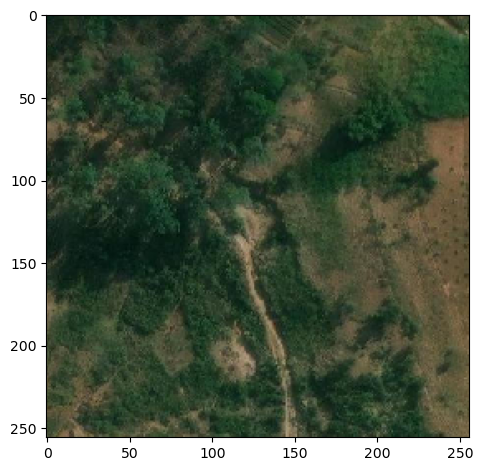

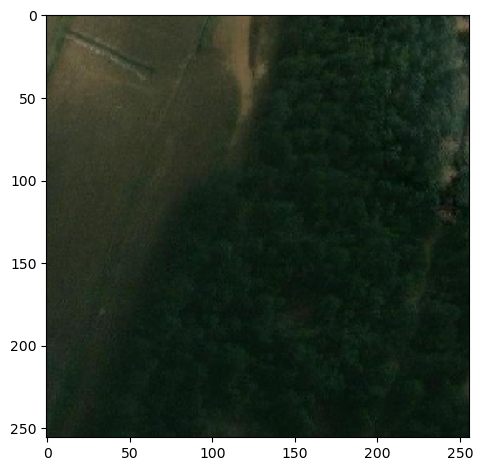

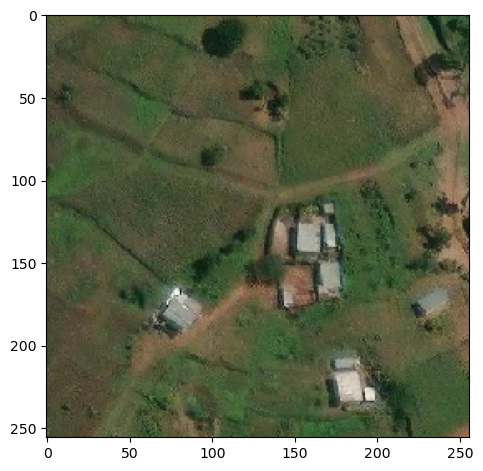

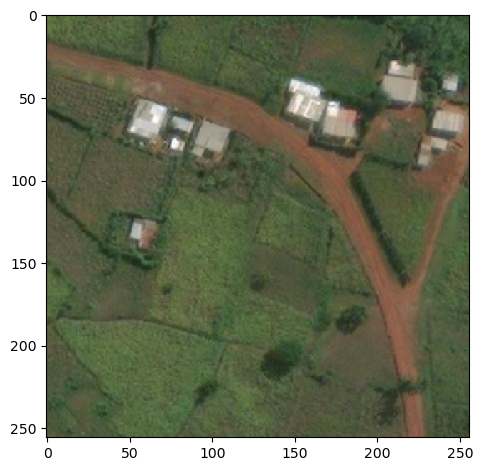

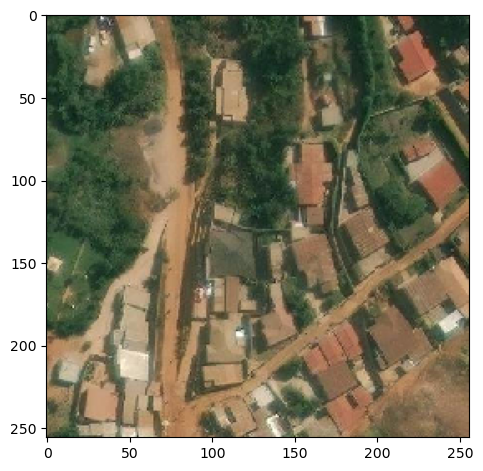

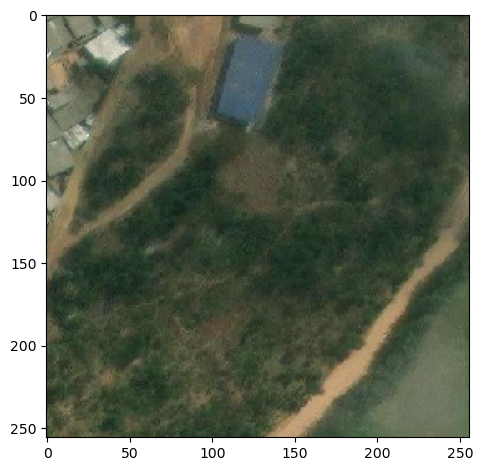

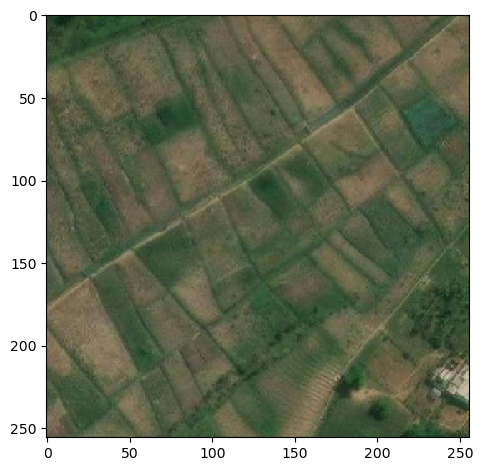

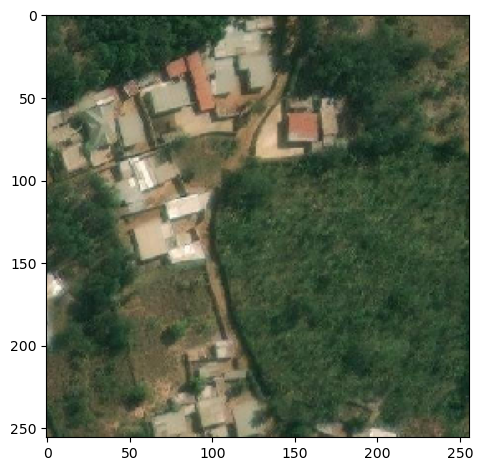

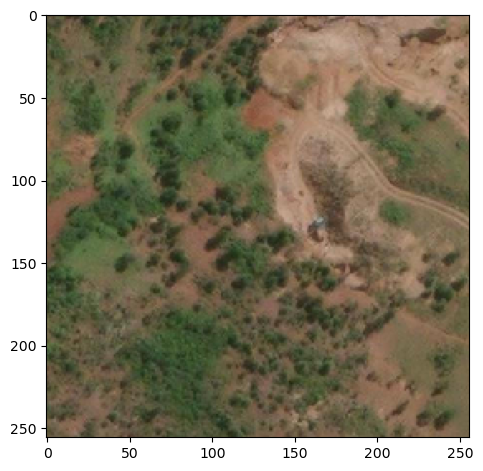

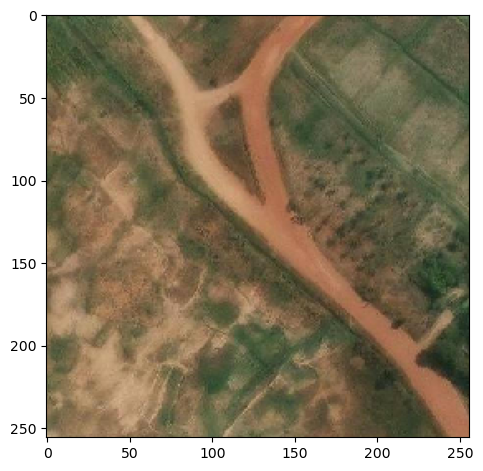

In [30]:
for index in random.sample(range(754), 10):
    name_index = "{}_{}_{}.tif".format(city, code, str(index).zfill(5))
    img_tile = rasterio.open(os.path.join(dst_image_dir, name_index))

    plt.figure(figsize=(12, 12))
    plt.subplot(1, 2, 1)
    plt.imshow(img_tile.read().transpose(1, 2, 0))
    plt.subplot